# 1. Imports


1. Verify hd-bet works for PET images (try with and without skull)
     -> If not look at bet2
   
3. Try in Native space rather than MNI space
   
4. Try ADC if available

5. Expand Dataset
   
     -> Check unprocessed data, ADNI data (possibly ADNI for validation later)

6. Read literature and try different architectures
   
    -> Log metrics on test set after each experiment
        (SSIM, MSE, Inception score)

If use department GPU, make sure don't hog resources (esp if running overnight)

In [1]:
import matplotlib.pyplot as plt
import multiprocessing as mp
import nibabel as nib
import numpy as np
import os
import pandas as pd
import tempfile
from sklearn import metrics
import time
from time import time
import torch
import torch.nn as nn
import torch.nn.functional as F
from monai.networks.nets import AHNet
from tqdm import tqdm
import monai
from monai.utils import progress_bar
from monai.config import print_config
from monai.data import Dataset, DataLoader, CacheDataset
from monai.transforms import (
    Activations,
    AsDiscrete,
    Compose,
    EnsureChannelFirstd,
    EnsureTyped,
    LoadImaged,
    MapTransform,
    Orientationd,
    RandRicianNoised,
    RandRotated,
    RandFlipd,
    Resized,
    Rotate90d,
    ScaleIntensityd,
    DeleteItemsd,
    NormalizeIntensityd
)
from monai.losses.ssim_loss import SSIMLoss
import statistics

In [2]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="5,6,7"

In [3]:
%store -r dictionary_train
%store -r dictionary_valid
%store -r dictionary_test

In [4]:
# global variables
image_size = (128,128,64)

# 2. MONAI Dataloader

In [5]:
#To turn 4D images to 3D (from Ashley's classifier)
class MakeSingleVolumed(MapTransform):
    def __call__(self, data):
        for key in self.keys:
            num_volumes = data[key].shape[0]
            data["NumVolumes"] = num_volumes
            
            if num_volumes != 1:
                middle_volume = num_volumes // 2
                new_data = np.empty((1,image_size[0],image_size[1],image_size[2]))
                new_data[0,:,:,:] = data[key][middle_volume,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
            else:
                new_data = np.empty((1,image_size[0],image_size[1],image_size[2]))
                new_data[0,:,:,:] = data[key][0,:,:,:]
                # fill last slice with the value of num_volumes 
                new_data[0,:,:,-1] = np.zeros((data[key].shape[1],data[key].shape[2])) + num_volumes
                data[key] = torch.from_numpy(new_data)
                
        return data

#This uses the mask to scale the intensity of the image (not being used rn)
class ScaleImaged(MapTransform):
    def __call__(self, data):
            data[self.keys[0]] *= (0.4+data[self.keys[1]])

            return data

In [6]:
train_transforms = Compose(
    [
        LoadImaged(keys=["t1", "t1c", "t2", "flair", "pet"], reader=monai.data.ITKReader, image_only=True),
        EnsureChannelFirstd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Orientationd(keys=["t1", "t1c", "t2", "flair", "pet"], axcodes="RAS"),        
        EnsureTyped(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Resized(keys=["t1", "t1c", "t2", "flair", "pet"], spatial_size=image_size),
        MakeSingleVolumed(keys=["t1", "t1c", "t2", "flair", "pet"]),
        Rotate90d(keys=["t1", "t1c", "t2", "flair", "pet"]),
        RandFlipd(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.5, spatial_axis=1),
        RandRotated(keys=["t1", "t1c", "t2", "flair", "pet"], prob=0.6, range_z=0.3),
        ScaleIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"]),
        NormalizeIntensityd(keys=["t1", "t1c", "t2", "flair", "pet"])
    ]
)

In [7]:
val_files = dictionary_train[:10]

check_ds = Dataset(data=val_files, transform=train_transforms)
check_DataLoader = DataLoader(check_ds, batch_size=1, shuffle=False)

It has been 14.90439510345459 seconds since the loop started


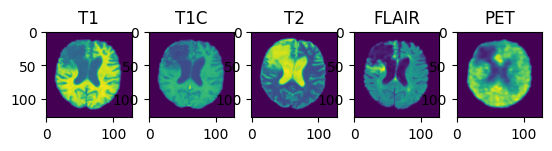

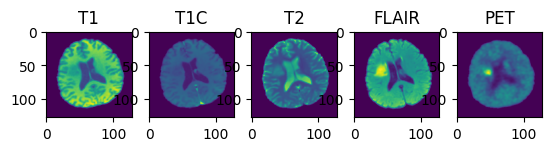

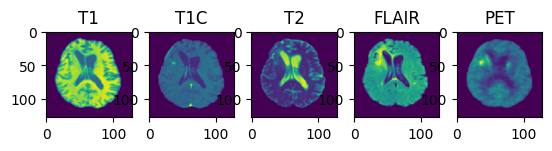

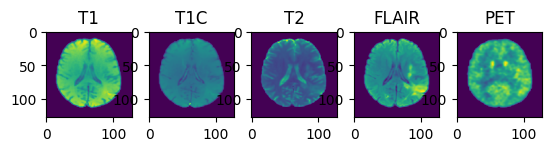

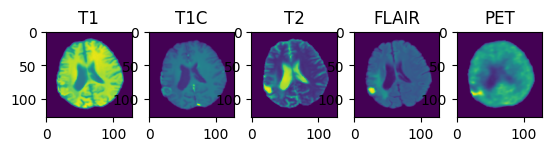

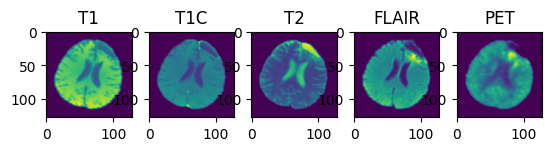

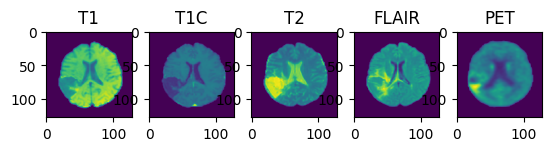

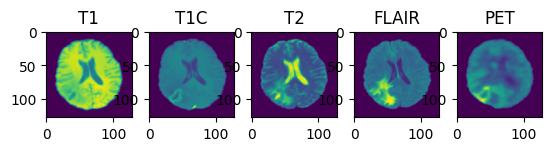

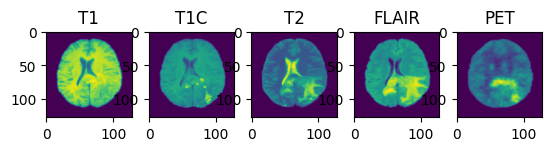

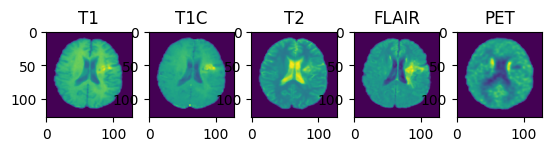

In [8]:
program_starts = time()
step = 1350
slice_index = 32
for item in check_DataLoader:
    image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index]
    
    f, axarr = plt.subplots(1, 5)
    
    axarr[0].imshow(image_datas[0])
    axarr[0].set_title("T1")
    axarr[1].imshow(image_datas[1])
    axarr[1].set_title("T1C")
    axarr[2].imshow(image_datas[2])
    axarr[2].set_title("T2")
    axarr[3].imshow(image_datas[3])
    axarr[3].set_title("FLAIR")
    axarr[4].imshow(image_datas[4])
    axarr[4].set_title("PET")
    
    step += 1
now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

In [9]:
print(os.cpu_count())

train_ds = CacheDataset(data=dictionary_train, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_loader = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count(), drop_last=False)

train_metric_ds = CacheDataset(data=dictionary_train[:10], transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
train_metric_loader = DataLoader(train_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

valid_ds = CacheDataset(data=dictionary_valid, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
valid_loader = DataLoader(valid_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

test_ds = CacheDataset(data=dictionary_test, transform=train_transforms, cache_num=1024, num_workers=os.cpu_count())
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False, num_workers=os.cpu_count())

80


Loading dataset:   0%|                                                                                                                                   | 0/185 [00:00<?, ?it/s]

Loading dataset:   1%|▋                                                                                                                        | 1/185 [00:55<2:49:51, 55.39s/it]

Loading dataset:   1%|█▎                                                                                                                       | 2/185 [00:56<1:11:25, 23.42s/it]

Loading dataset:   2%|█▉                                                                                                                         | 3/185 [00:57<40:01, 13.19s/it]

Loading dataset:   2%|██▋                                                                                                                        | 4/185 [00:59<26:02,  8.63s/it]

Loading dataset:   3%|███▎                                                                                                                       | 5/185 [01:03<19:41,  6.56s/it]

Loading dataset:   3%|███▉                                                                                                                       | 6/185 [01:06<17:37,  5.91s/it]

Loading dataset:   4%|████▋                                                                                                                      | 7/185 [01:08<13:18,  4.49s/it]

Loading dataset:   9%|██████████▌                                                                                                               | 16/185 [01:19<05:19,  1.89s/it]

Loading dataset:   9%|███████████▏                                                                                                              | 17/185 [01:19<04:44,  1.69s/it]

Loading dataset:  10%|███████████▊                                                                                                              | 18/185 [01:22<05:11,  1.87s/it]

Loading dataset:  10%|████████████▌                                                                                                             | 19/185 [01:32<07:29,  2.71s/it]

Loading dataset:  11%|█████████████▏                                                                                                            | 20/185 [01:34<08:41,  3.16s/it]

Loading dataset:  11%|█████████████▊                                                                                                            | 21/185 [01:35<07:25,  2.72s/it]

Loading dataset:  12%|██████████████▌                                                                                                           | 22/185 [01:37<06:29,  2.39s/it]

Loading dataset:  12%|███████████████▏                                                                                                          | 23/185 [01:37<05:14,  1.94s/it]

Loading dataset:  13%|███████████████▊                                                                                                          | 24/185 [01:37<04:00,  1.50s/it]

Loading dataset:  14%|████████████████▍                                                                                                         | 25/185 [01:39<03:37,  1.36s/it]

Loading dataset:  14%|█████████████████▏                                                                                                        | 26/185 [01:39<02:41,  1.02s/it]

Loading dataset:  15%|█████████████████▊                                                                                                        | 27/185 [01:40<02:47,  1.06s/it]

Loading dataset:  15%|██████████████████▍                                                                                                       | 28/185 [01:42<03:26,  1.31s/it]

Loading dataset:  16%|███████████████████                                                                                                       | 29/185 [01:43<03:23,  1.30s/it]

Loading dataset:  16%|███████████████████▊                                                                                                      | 30/185 [01:43<02:34,  1.00it/s]

Loading dataset:  17%|████████████████████▍                                                                                                     | 31/185 [01:44<02:24,  1.07it/s]

Loading dataset:  17%|█████████████████████                                                                                                     | 32/185 [01:44<01:57,  1.30it/s]

Loading dataset:  18%|█████████████████████▊                                                                                                    | 33/185 [01:45<01:30,  1.68it/s]

Loading dataset:  18%|██████████████████████▍                                                                                                   | 34/185 [01:45<01:25,  1.76it/s]

Loading dataset:  44%|█████████████████████████████████████████████████████▍                                                                    | 81/185 [01:46<00:03, 29.14it/s]

Loading dataset:  46%|████████████████████████████████████████████████████████▋                                                                 | 86/185 [01:51<00:16,  6.08it/s]

Loading dataset:  48%|██████████████████████████████████████████████████████████▋                                                               | 89/185 [01:51<00:15,  6.37it/s]

Loading dataset:  50%|████████████████████████████████████████████████████████████▋                                                             | 92/185 [01:52<00:16,  5.73it/s]

Loading dataset:  51%|█████████████████████████████████████████████████████████████▉                                                            | 94/185 [01:53<00:16,  5.43it/s]

Loading dataset:  52%|███████████████████████████████████████████████████████████████▎                                                          | 96/185 [01:57<00:40,  2.18it/s]

Loading dataset:  52%|███████████████████████████████████████████████████████████████▉                                                          | 97/185 [01:58<00:45,  1.95it/s]

Loading dataset:  56%|███████████████████████████████████████████████████████████████████▎                                                     | 103/185 [02:02<00:43,  1.87it/s]

Loading dataset:  62%|███████████████████████████████████████████████████████████████████████████▏                                             | 115/185 [02:02<00:17,  3.90it/s]

Loading dataset:  69%|███████████████████████████████████████████████████████████████████████████████████▋                                     | 128/185 [02:02<00:08,  6.94it/s]

Loading dataset:  89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 164/185 [02:02<00:01, 18.74it/s]

Loading dataset:  95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 176/185 [02:02<00:00, 21.57it/s]

Loading dataset: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 185/185 [02:03<00:00,  1.50it/s]

Loading dataset:   0%|                                                                                                                                    | 0/10 [00:00<?, ?it/s]

Loading dataset:  10%|████████████▍                                                                                                               | 1/10 [00:05<00:50,  5.57s/it]

Loading dataset: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:05<00:00,  1.79it/s]

Loading dataset:   0%|                                                                                                                                     | 0/5 [00:00<?, ?it/s]

Loading dataset:  20%|█████████████████████████                                                                                                    | 1/5 [00:02<00:10,  2.72s/it]

Loading dataset: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:02<00:00,  1.84it/s]

Loading dataset:   0%|                                                                                                                                    | 0/57 [00:00<?, ?it/s]

Loading dataset:   2%|██▏                                                                                                                         | 1/57 [00:36<34:17, 36.75s/it]

Loading dataset:  16%|███████████████████▌                                                                                                        | 9/57 [00:36<02:23,  2.99s/it]

Loading dataset:  23%|████████████████████████████                                                                                               | 13/57 [00:37<01:20,  1.82s/it]

Loading dataset: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 57/57 [00:37<00:00,  1.53it/s]

# 3. Model Setup


In [10]:
class GLA_Generator(nn.Module):
    def __init__(self):
        super(GLA_Generator, self).__init__()
        self.ahnet_global = AHNet(spatial_dims=3, in_channels=4, out_channels=16, pretrained=True)

        channels = [4, 6, 12, 6, 4]
        strides = [1, 1, 1, 1, 1]
        
        self.ahnet_1 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=7, channels=channels, strides=strides)
        self.ahnet_2 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=7, channels=channels, strides=strides)
        self.ahnet_3 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=7, channels=channels, strides=strides)
        self.ahnet_4 = monai.networks.nets.AttentionUnet(spatial_dims=3, in_channels=4, out_channels=7, channels=channels, strides=strides)

        self.conv1 = nn.Conv3d(23, 16, kernel_size=1)
        self.bn1 = nn.BatchNorm3d(16)
        self.relu = nn.ReLU()
        #self.dropout = torch.nn.Dropout(0)
        self.conv2 = nn.Conv3d(16, 1, kernel_size=1)
        self.bn2 = nn.BatchNorm3d(1)

    def forward(self, x):
        batch_size, channels, width, height, depth = x.shape
        half_width, half_height = width // 2, height // 2
        
        # Splitting the input into 4 patches
        patch_1 = x[:, :, :half_width, :half_height, :]
        patch_2 = x[:, :, :half_width, half_height:, :]
        patch_3 = x[:, :, half_width:, :half_height, :]
        patch_4 = x[:, :, half_width:, half_height:, :]

        x = self.ahnet_global(x)
        patch_1 = self.ahnet_1(patch_1)
        patch_2 = self.ahnet_2(patch_2)
        patch_3 = self.ahnet_3(patch_3)
        patch_4 = self.ahnet_4(patch_4)

        # Concatenating the processed patches
        top_row = torch.cat([patch_1, patch_2], dim=3)  # Concatenate along the height
        bottom_row = torch.cat([patch_3, patch_4], dim=3)  # Concatenate along the height
        concatenated_patches = torch.cat([top_row, bottom_row], dim=2)  # Concatenate along the width

        x = torch.cat([x, concatenated_patches], dim=1)

        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        #x = self.dropout(x)
        x = self.conv2(x)
        x = self.bn2(x)

        return x

### 3.1 Model and Device Setup

In [11]:
# Use GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

gen_net = GLA_Generator()

disc_net = monai.networks.nets.Discriminator(
    in_shape=(128, 128, 64),
    channels=(8, 16, 32, 64, 128, 64, 1),
    strides=(2, 2, 2, 2, 2, 1, 1),
    num_res_units=1,
    kernel_size=3,
)

# If multiple GPUs are available, run in parallel
if torch.cuda.device_count() > 1:
    print("Let's use", torch.cuda.device_count(), "GPUs!")
    gen_net = nn.DataParallel(gen_net)
    disc_net = nn.DataParallel(disc_net)

gen_net.to(device)
disc_net.to(device)

real_label = 1
gen_label = 0

disc_loss = torch.nn.BCELoss()
gen_loss = torch.nn.BCELoss()
gen_loss2 = monai.metrics.MultiScaleSSIMMetric(spatial_dims=3, kernel_size=4)

disc_opt = torch.optim.Adam(disc_net.parameters(), 0.00005)
gen_opt = torch.optim.Adam(gen_net.parameters(), 0.0002)

def discriminator_loss(gen_images, real_images):
    """
    The discriminator loss if calculated by comparing its
    prediction for real and generated images.

    """
    real = real_images.new_full((real_images.shape[0], 1), real_label)
    gen = gen_images.new_full((gen_images.shape[0], 1), gen_label)

    # Training discriminator to label 1 on real images
    realloss = disc_loss(disc_net(real_images), real) 

    # Training discriminator to label 0 on generated images
    genloss = disc_loss(disc_net(gen_images.detach()), gen)

    return (realloss + genloss) / 2


def generator_loss(input, real_images):
    """
    The generator loss is calculated by determining how well
    the discriminator was fooled by the generated images.

    """
    output = disc_net(input[:,0,:,:,:])
    cats = output.new_full(output.shape, real_label)
    fooling_disc = gen_loss(output, cats)
    ssim = 1 - torch.mean(gen_loss2(input, real_images))
    
    # Train generator to fool the discriminator into giving a score of 1, and to have a high SSIM
    return (2*fooling_disc) + ssim

cuda


The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.


Let's use 3 GPUs!


### 3.2 Training


----------
epoch 1/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:33, 84.85s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.89s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.35s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.05s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.01s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.58s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.04s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.85s/it]

----------
epoch 2/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:20<14:48, 80.75s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:23<05:49, 34.95s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:26<03:02, 20.31s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:29<01:48, 13.55s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:32<01:07,  9.70s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:35<00:44,  7.38s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:38<00:29,  5.90s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:41<00:19,  4.94s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:44<00:12,  4.29s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:46<00:07,  3.85s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:49<00:03,  3.55s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.53s/it]

----------
epoch 3/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:48, 86.21s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.22s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:13, 21.55s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.20s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.13s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.67s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.21s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 4/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:15, 88.65s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:22, 38.22s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:20, 22.28s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:57, 14.64s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.41s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:47,  7.86s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:46<00:31,  6.24s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:20,  5.18s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:52<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:58<00:03,  3.75s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.12s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.21s/it]

----------
epoch 5/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:12, 88.42s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:21, 38.15s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:18, 22.06s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:56, 14.51s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.33s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:47,  7.94s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:46<00:31,  6.30s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:20,  5.22s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:52<00:13,  4.50s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:58<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.17s/it]

----------
epoch 6/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.81s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.09s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.51s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.18s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.12s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 7/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:50, 86.44s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.33s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.62s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:55, 14.39s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.26s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.76s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.15s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.02s/it]

----------
epoch 8/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:47, 86.16s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.18s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.54s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.17s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.10s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.65s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.09s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 9/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:21<14:52, 81.14s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:24<05:51, 35.16s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:27<03:05, 20.57s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:30<01:48, 13.58s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:33<01:08,  9.72s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:35<00:44,  7.40s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:38<00:29,  5.92s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:41<00:19,  4.95s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:44<00:12,  4.30s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:47<00:07,  3.86s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:50<00:03,  3.55s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:51<00:00,  2.98s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.54s/it]

----------
epoch 10/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:21, 83.78s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:02, 36.22s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.01s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.86s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:10, 10.03s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.60s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.07s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.75s/it]

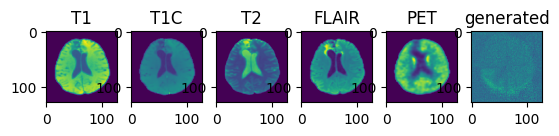

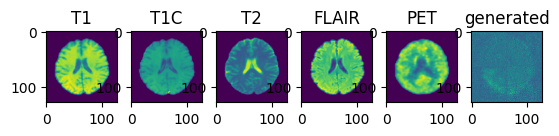

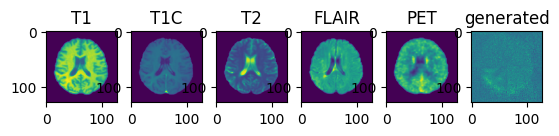

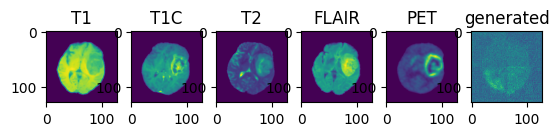

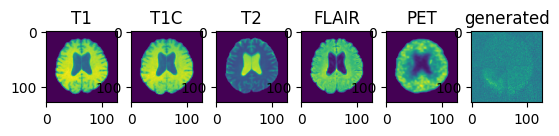

validation avg MS-SSIM: 0.1620 , train avg MS-SSIM: 0.1588
----------
epoch 11/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:22<15:06, 82.38s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:25<05:56, 35.64s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:11, 21.26s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 14.00s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.99s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.57s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:40<00:30,  6.04s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:43<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:46<00:13,  4.35s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:49<00:07,  3.89s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 12/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:21<14:59, 81.77s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:24<05:53, 35.37s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:27<03:05, 20.56s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:30<01:48, 13.58s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:33<01:08,  9.72s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:36<00:45,  7.51s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:39<00:30,  6.01s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:42<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:45<00:13,  4.34s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:48<00:07,  3.89s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:50<00:03,  3.57s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  3.00s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  9.58s/it]

----------
epoch 13/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:17, 83.43s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:00, 36.09s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:08, 20.94s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.83s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.90s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.53s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:40<00:30,  6.02s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:43<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.75s/it]

----------
epoch 14/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:47, 86.18s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.19s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.53s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.18s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.24s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.13s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 15/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:24, 84.03s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:02, 36.29s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.03s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.86s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.94s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.55s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.02s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 16/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:19, 83.60s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:01, 36.15s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:15, 21.73s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:54, 14.29s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:11, 10.21s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.72s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 17/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:29, 84.51s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:05, 36.51s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.16s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.94s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.96s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:46,  7.67s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

----------
epoch 18/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:31, 84.66s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:08, 36.80s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.33s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.05s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.03s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.61s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.07s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 19/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:39, 85.43s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.88s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.37s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.08s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.17s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.13s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 20/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:28, 84.37s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:04, 36.46s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.16s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.96s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.97s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.56s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.82s/it]

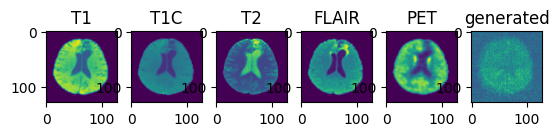

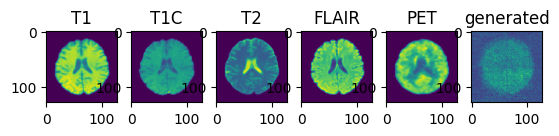

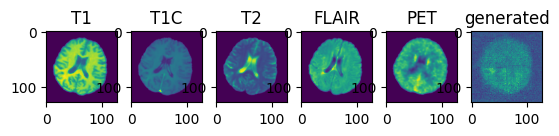

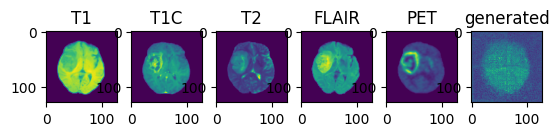

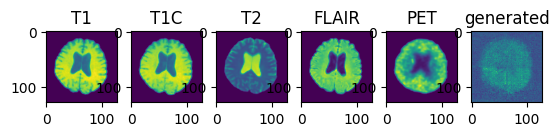

validation avg MS-SSIM: 0.3396 , train avg MS-SSIM: 0.3364
----------
epoch 21/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:41, 85.55s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.96s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.42s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.11s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.07s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.92s/it]

----------
epoch 22/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:51, 86.46s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.30s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.59s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.21s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:10, 10.12s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.67s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.48s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 23/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:42, 85.69s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.99s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.43s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:54, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.16s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.14s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 24/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:16, 83.31s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:00, 36.04s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:08, 20.92s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.82s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.88s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:37<00:45,  7.50s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:40<00:29,  6.00s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:46<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:49<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.73s/it]

----------
epoch 25/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.75s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.45s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.75s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.32s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.21s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.02s/it]

----------
epoch 26/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:35, 85.00s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:07, 36.73s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.29s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.05s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.03s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 27/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:02, 87.46s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:19, 37.94s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.95s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.42s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.26s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.75s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.17s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.08s/it]

----------
epoch 28/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:22<15:12, 82.95s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:25<05:59, 35.90s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:28<03:07, 20.85s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:31<01:50, 13.76s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:34<01:09,  9.97s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:37<00:45,  7.59s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:40<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:43<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:46<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:49<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.14s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 29/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:35, 85.09s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:07, 36.75s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.28s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.02s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.60s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.07s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.87s/it]

----------
epoch 30/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.78s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:15, 37.55s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.91s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.42s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.27s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.73s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.08s/it]

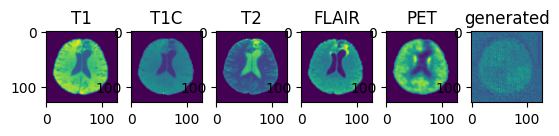

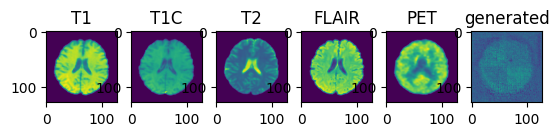

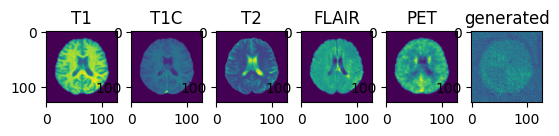

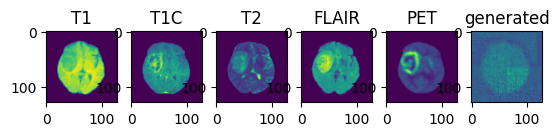

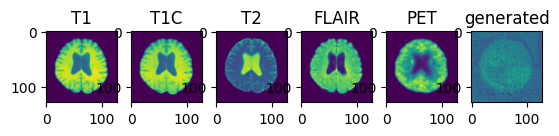

validation avg MS-SSIM: 0.0302 , train avg MS-SSIM: 0.0000
----------
epoch 31/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:47, 86.12s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.20s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.53s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.16s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.11s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.66s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.51s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.02s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 32/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:37, 85.22s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.82s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.34s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.07s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.18s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 33/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:55, 86.85s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.47s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.68s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.26s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.22s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 34/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.81s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.62s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:17, 21.93s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:55, 14.41s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.25s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 35/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:53, 86.69s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.43s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.73s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.31s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.22s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.28s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.24s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.54s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.06s/it]

----------
epoch 36/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:29<16:19, 89.06s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:32<06:25, 38.59s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:35<03:20, 22.28s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:38<01:57, 14.63s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.39s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:47,  7.83s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:46<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:20,  5.17s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:52<00:13,  4.57s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:08,  4.05s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:58<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.22s/it]

----------
epoch 37/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:45, 85.92s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.07s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.46s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.13s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.22s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.01s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 38/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:44, 85.84s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.10s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.51s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.19s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.13s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.19s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 39/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.82s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.63s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.24s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:53, 14.15s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.64s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.09s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.37s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 40/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:20, 83.72s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:01, 36.17s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:08, 20.99s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.85s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.90s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.51s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.74s/it]

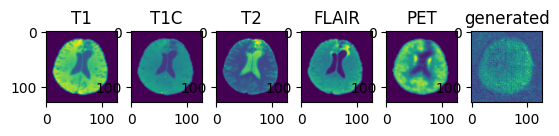

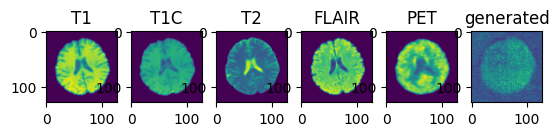

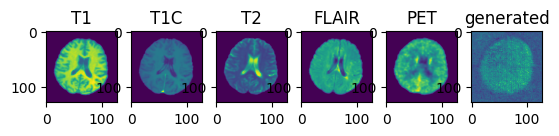

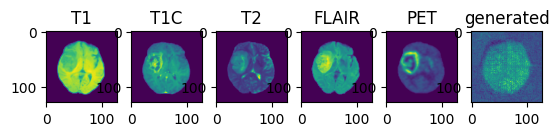

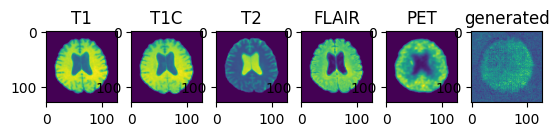

validation avg MS-SSIM: 0.3509 , train avg MS-SSIM: 0.3487
----------
epoch 41/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:45, 85.93s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.09s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.51s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.29s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.19s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.71s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.14s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 42/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:29<16:22, 89.28s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:32<06:24, 38.49s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:35<03:20, 22.28s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:38<01:57, 14.63s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:41<01:12, 10.41s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:47,  7.87s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:47<00:31,  6.36s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:50<00:21,  5.26s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:53<00:13,  4.52s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:58<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.26s/it]

----------
epoch 43/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:09, 88.11s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:19, 37.96s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:18, 22.09s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:56, 14.51s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.31s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.78s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.12s/it]

----------
epoch 44/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:29<16:24, 89.53s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:32<06:26, 38.61s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:35<03:20, 22.31s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:38<01:57, 14.64s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:41<01:12, 10.40s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:44<00:47,  7.97s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:47<00:31,  6.31s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:50<00:20,  5.22s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:53<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:58<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00, 10.25s/it]

----------
epoch 45/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:58, 87.13s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:17, 37.78s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.85s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:54, 14.36s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.21s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.02s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

----------
epoch 46/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:39, 85.42s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.87s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.34s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.05s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 47/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:10, 88.24s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:20, 38.04s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:17, 21.99s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.46s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.29s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.53s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.02s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.15s/it]

----------
epoch 48/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:03, 87.58s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:18, 37.82s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.92s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.49s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:13, 10.49s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:47,  7.92s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:31,  6.28s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.21s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.53s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.03s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.16s/it]

----------
epoch 49/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:36<17:39, 96.33s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:39<06:53, 41.36s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:42<03:34, 23.79s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:44<02:04, 15.53s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:47<01:16, 10.96s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:50<00:49,  8.22s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:53<00:32,  6.49s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:56<00:21,  5.46s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:59<00:13,  4.66s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [02:02<00:08,  4.11s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [02:05<00:03,  3.74s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:10<00:00, 10.91s/it]

----------
epoch 50/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:39, 85.38s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.92s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.54s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.17s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.10s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.65s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.09s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.92s/it]

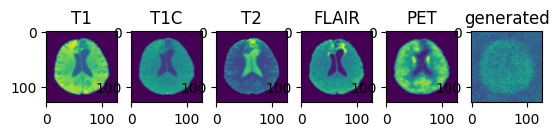

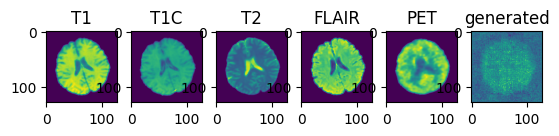

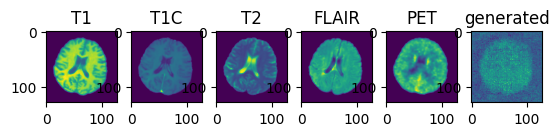

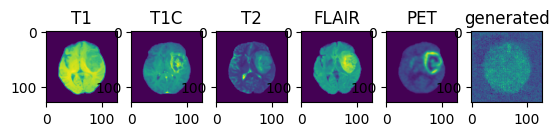

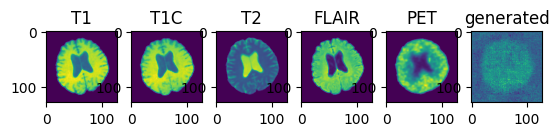

validation avg MS-SSIM: 0.3274 , train avg MS-SSIM: 0.3220
----------
epoch 51/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:45, 85.92s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.08s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.64s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.17s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.71s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.72s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 52/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:49, 86.34s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.25s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.58s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.21s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.82s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.46s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 53/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.78s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.45s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.68s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.27s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.17s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.71s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.54s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.03s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 54/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:51, 86.46s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.30s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.62s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:12, 10.29s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.16s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.13s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 55/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:55, 86.84s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.48s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.69s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.27s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.17s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.20s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.48s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 56/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:03, 87.56s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:17, 37.78s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.86s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:56, 14.51s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.32s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.80s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.73s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.09s/it]

----------
epoch 57/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:07, 87.96s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:19, 37.94s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.94s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.42s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.28s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.78s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:31,  6.29s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.21s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.48s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.14s/it]

----------
epoch 58/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:45, 85.92s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.30s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.59s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.21s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.14s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.03s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 59/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:58, 87.13s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:15, 37.58s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.75s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.30s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.19s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.82s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

----------
epoch 60/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.74s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.41s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.65s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.48s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.02s/it]

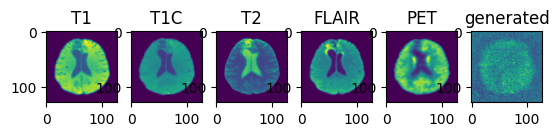

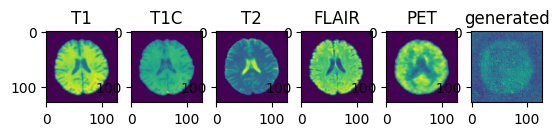

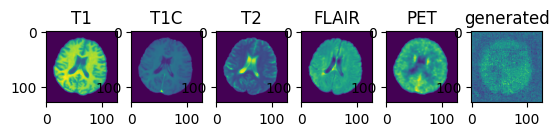

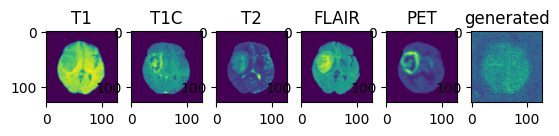

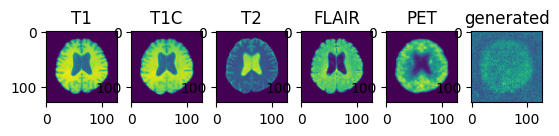

validation avg MS-SSIM: 0.3213 , train avg MS-SSIM: 0.3203
----------
epoch 61/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:29<16:20, 89.13s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:32<06:24, 38.40s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:19, 22.19s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:56, 14.59s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.37s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:46,  7.82s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:46<00:31,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:52<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:58<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.18s/it]

----------
epoch 62/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:05, 87.79s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:18, 37.85s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.89s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.40s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.38s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:47,  7.84s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.11s/it]

----------
epoch 63/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:29<16:23, 89.44s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:32<06:25, 38.54s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:35<03:20, 22.27s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:38<01:56, 14.62s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:41<01:13, 10.43s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:44<00:47,  7.87s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:47<00:31,  6.28s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:50<00:21,  5.28s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:53<00:14,  4.80s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:56<00:08,  4.20s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:59<00:03,  3.81s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.19s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.35s/it]

----------
epoch 64/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:30<16:31, 90.17s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:33<06:28, 38.83s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:35<03:21, 22.42s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:39<01:59, 14.90s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:42<01:14, 10.67s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:45<00:49,  8.17s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:48<00:32,  6.45s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:51<00:21,  5.31s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:54<00:13,  4.55s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:57<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [02:00<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.36s/it]

----------
epoch 65/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:32<16:53, 92.10s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:35<06:36, 39.64s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:37<03:25, 22.86s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:40<01:59, 15.00s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:43<01:14, 10.67s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:46<00:48,  8.04s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:50<00:32,  6.47s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:52<00:21,  5.34s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:55<00:13,  4.58s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:58<00:08,  4.06s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [02:01<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.50s/it]

----------
epoch 66/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:11, 88.36s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:23, 38.33s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:19, 22.15s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:56, 14.56s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.36s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:46,  7.82s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:46<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.17s/it]

----------
epoch 67/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:45, 85.95s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.09s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.48s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.15s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.75s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.93s/it]

----------
epoch 68/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:28, 84.36s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:04, 36.45s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.13s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.92s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.94s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.54s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.01s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 69/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:37, 85.21s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:07, 36.78s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.31s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:55, 14.44s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.28s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.13s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 70/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:02, 87.51s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:17, 37.74s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.86s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.39s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.26s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.76s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.25s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.52s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.02s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.10s/it]

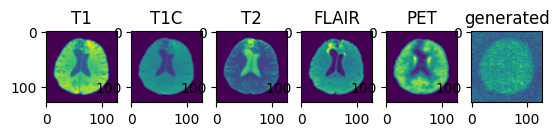

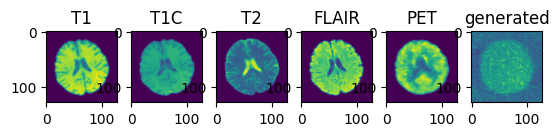

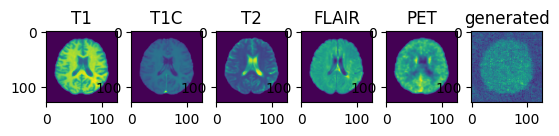

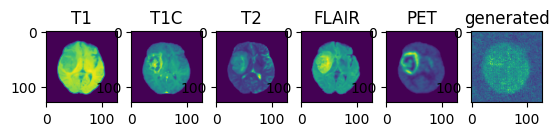

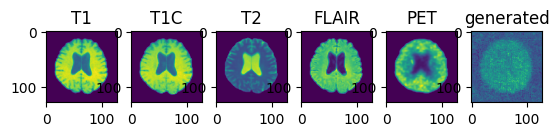

validation avg MS-SSIM: 0.3325 , train avg MS-SSIM: 0.3316
----------
epoch 71/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:41, 85.55s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.92s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.39s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.09s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.05s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.61s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.37s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.59s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 72/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:50, 86.45s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:15, 37.56s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.73s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.30s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.18s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.71s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.03s/it]

----------
epoch 73/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:24, 84.03s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:03, 36.33s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.07s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.90s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.05s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.62s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.07s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.80s/it]

----------
epoch 74/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:53, 86.64s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.37s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.64s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.24s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 75/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:23, 83.92s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:02, 36.27s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.21s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.99s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.98s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.57s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.04s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.75s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.19s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 76/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:39, 85.44s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.90s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.39s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.10s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.06s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.63s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:31,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 77/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:40, 85.50s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.91s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:18, 22.07s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:56, 14.51s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:12, 10.32s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.79s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.02s/it]

----------
epoch 78/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.79s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.45s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.67s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.79s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00, 10.00s/it]

----------
epoch 79/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:45, 85.97s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.10s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.49s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.17s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.10s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.66s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.92s/it]

----------
epoch 80/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.75s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.64s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.23s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.98s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.64s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.59s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.85s/it]

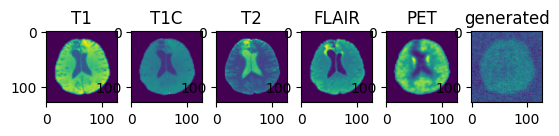

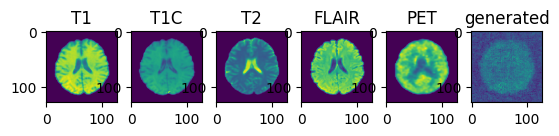

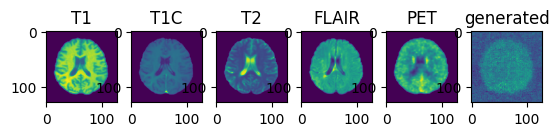

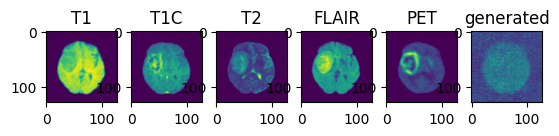

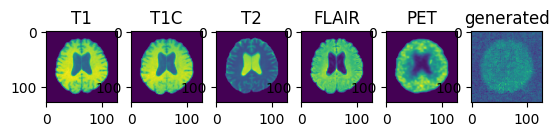

validation avg MS-SSIM: 0.3395 , train avg MS-SSIM: 0.3407
----------
epoch 81/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:58, 87.11s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:15, 37.55s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.72s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.42s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.26s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.75s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

----------
epoch 82/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:01, 87.42s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:17, 37.71s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.83s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:54, 14.37s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.23s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.74s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.06s/it]

----------
epoch 83/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:39, 85.43s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.88s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.53s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.18s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.11s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.65s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.02s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.92s/it]

----------
epoch 84/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:38, 85.35s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.84s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.35s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.06s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.03s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.01s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 85/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.07s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.13s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.48s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.14s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.07s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.63s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.07s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.46s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 86/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:42, 85.66s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.97s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.42s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.16s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.93s/it]

----------
epoch 87/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:58, 87.11s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:15, 37.57s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.75s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.31s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.20s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.22s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.06s/it]

----------
epoch 88/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:31, 84.66s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:05, 36.57s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.20s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.11s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.06s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.63s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.09s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 89/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.73s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.43s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.65s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.27s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.20s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.24s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.19s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.02s/it]

----------
epoch 90/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:23, 83.97s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:04, 36.46s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.12s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.92s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.93s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.55s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.03s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.37s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

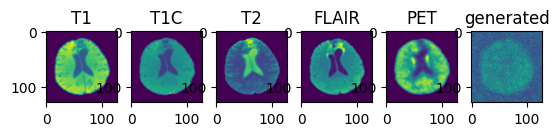

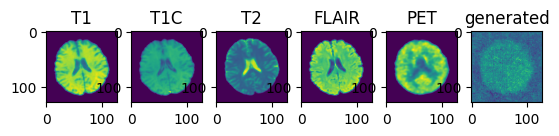

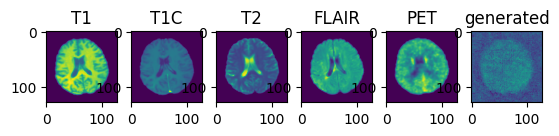

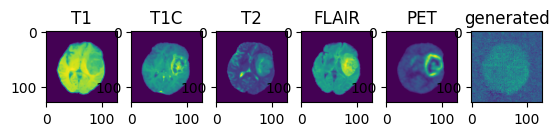

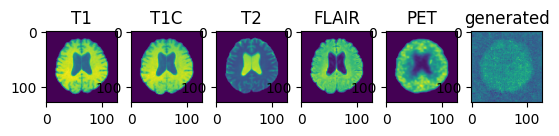

validation avg MS-SSIM: 0.3220 , train avg MS-SSIM: 0.3188
----------
epoch 91/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:49, 86.35s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.25s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.71s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.27s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.16s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.01s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 92/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:49, 86.27s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.23s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.56s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.19s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.12s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:47,  7.91s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.27s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.19s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.00s/it]

----------
epoch 93/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.73s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.03s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.45s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.12s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.08s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.64s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.09s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.92s/it]

----------
epoch 94/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:50, 86.36s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.27s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.58s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.21s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.13s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.66s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 95/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:31, 84.64s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:05, 36.55s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.20s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.98s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.98s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.63s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.17s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.46s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 96/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:52, 86.61s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.37s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:16, 21.78s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.31s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.18s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.01s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 97/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:42, 85.65s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 37.00s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.45s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.12s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.08s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.62s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.91s/it]

----------
epoch 98/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.03s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.14s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.67s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.26s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 99/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:14, 83.12s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<05:59, 35.93s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:28<03:07, 20.83s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:31<01:49, 13.74s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:34<01:08,  9.82s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:37<00:45,  7.56s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:40<00:30,  6.03s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:43<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:46<00:13,  4.35s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:49<00:07,  3.90s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.58s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.00s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.68s/it]

----------
epoch 100/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:55, 86.88s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:16, 37.67s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.80s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.34s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.22s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.05s/it]

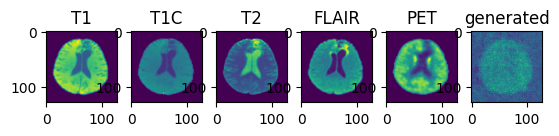

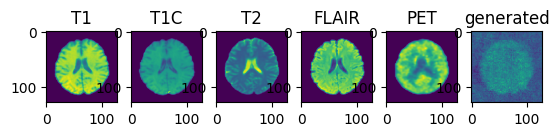

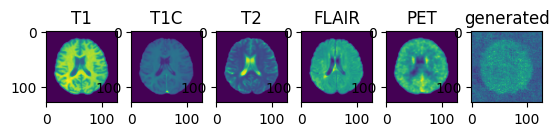

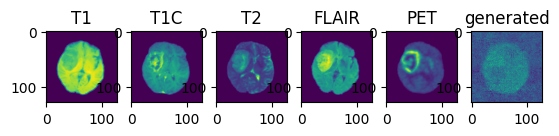

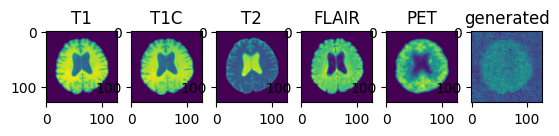

validation avg MS-SSIM: 0.3193 , train avg MS-SSIM: 0.3197
----------
epoch 101/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:41, 85.55s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.14s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.52s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.16s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.64s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.93s/it]

----------
epoch 102/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:39, 85.39s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.86s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.35s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.06s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 103/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:41, 85.56s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.94s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.39s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.08s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.03s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.60s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 104/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:05, 87.81s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:18, 37.86s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.91s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:56, 14.57s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.37s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:47,  7.83s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:31,  6.22s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.17s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.13s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.14s/it]

----------
epoch 105/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:35, 85.01s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:07, 36.71s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.26s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 14.00s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09, 10.00s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.58s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.05s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.87s/it]

----------
epoch 106/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:55, 86.91s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.49s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.84s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.36s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.23s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.74s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.71s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

----------
epoch 107/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.77s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.02s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.44s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.12s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.07s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.91s/it]

----------
epoch 108/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:48, 86.22s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.43s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.66s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.16s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.03s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 109/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:59, 87.26s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:16, 37.66s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.79s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:54, 14.35s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.39s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:47,  7.85s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:31,  6.22s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.09s/it]

----------
epoch 110/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:49, 86.28s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.26s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.57s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.20s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.11s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.66s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

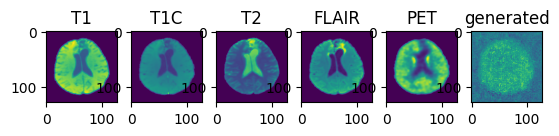

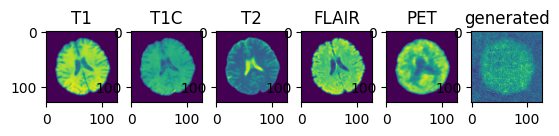

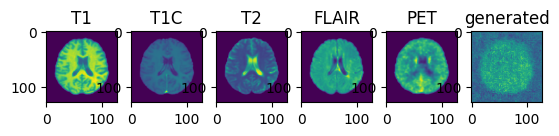

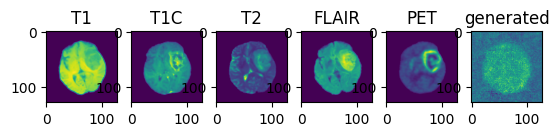

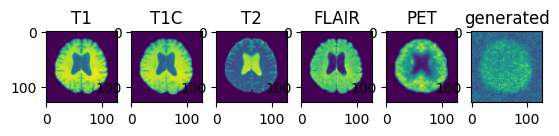

validation avg MS-SSIM: 0.3128 , train avg MS-SSIM: 0.3144
----------
epoch 111/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:26, 84.26s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.63s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.23s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.99s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.98s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.58s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.05s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.36s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

----------
epoch 112/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:33, 84.88s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.65s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.24s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 14.00s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.13s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 113/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:03, 87.61s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:17, 37.78s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.85s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:54, 14.37s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.24s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.52s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.07s/it]

----------
epoch 114/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.75s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.01s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.43s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.15s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.10s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.65s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 115/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.01s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.12s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.51s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.16s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.11s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.65s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.19s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.48s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 116/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:42, 85.72s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.00s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:14, 21.59s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.20s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.12s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.66s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 117/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:23, 83.93s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:02, 36.29s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.08s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.90s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.93s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.54s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 118/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.03s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.33s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.61s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.21s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.12s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.66s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 119/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:24, 84.09s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:04, 36.42s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:09, 21.10s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.91s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.94s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.66s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 120/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:47, 86.10s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.45s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.68s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.26s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.17s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.48s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

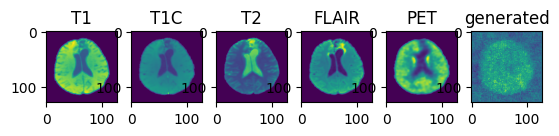

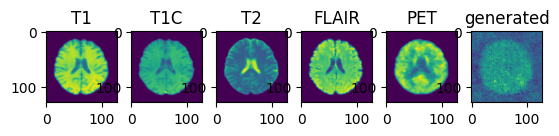

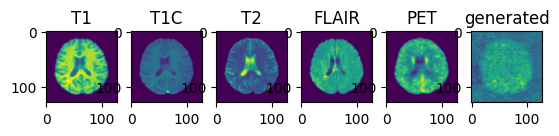

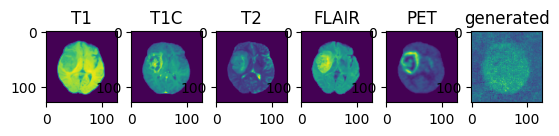

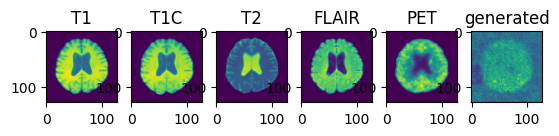

validation avg MS-SSIM: 0.3153 , train avg MS-SSIM: 0.3172
----------
epoch 121/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:34<17:19, 94.53s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:37<06:46, 40.62s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:40<03:30, 23.39s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:43<02:02, 15.29s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:46<01:15, 10.82s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:48<00:48,  8.12s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:51<00:32,  6.40s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:54<00:21,  5.28s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:57<00:13,  4.53s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [02:00<00:08,  4.02s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [02:03<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:07<00:00, 10.61s/it]

----------
epoch 122/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:51, 86.50s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.30s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.58s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.19s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.23s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 123/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:11, 88.32s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:20, 38.08s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:18, 22.01s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:55, 14.47s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.29s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.23s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.50s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.13s/it]

----------
epoch 124/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:33, 84.85s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.65s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.23s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.12s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.06s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.61s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.36s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.90s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.58s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.85s/it]

----------
epoch 125/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:03, 87.55s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:17, 37.75s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.83s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:54, 14.35s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.22s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.19s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.05s/it]

----------
epoch 126/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:34<17:19, 94.50s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:37<06:46, 40.61s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:40<03:32, 23.56s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:43<02:03, 15.41s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:46<01:16, 10.90s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:49<00:49,  8.18s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:52<00:32,  6.45s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:55<00:21,  5.31s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:57<00:13,  4.55s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [02:00<00:08,  4.03s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [02:04<00:03,  3.76s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00,  3.13s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:08<00:00, 10.67s/it]

----------
epoch 127/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:37, 85.24s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.81s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:11, 21.32s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.04s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.59s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 128/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:01, 87.37s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:16, 37.67s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.99s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.44s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.27s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.75s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.16s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.10s/it]

----------
epoch 129/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:28, 84.41s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:04, 36.48s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.15s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.95s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.96s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.59s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.04s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.36s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.59s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.01s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 130/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.73s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:12, 37.21s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.55s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.20s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.12s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.66s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

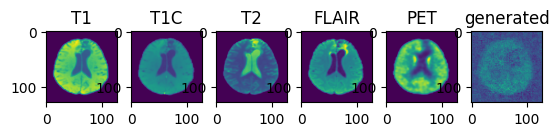

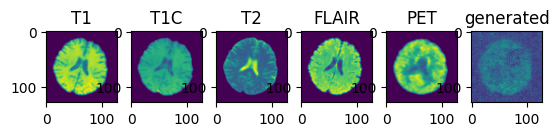

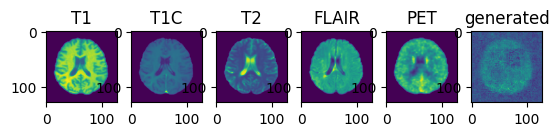

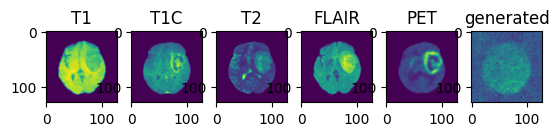

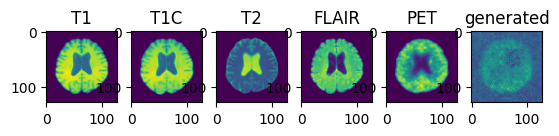

validation avg MS-SSIM: 0.3374 , train avg MS-SSIM: 0.3422
----------
epoch 131/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:38, 85.31s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.81s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:11, 21.32s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.18s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.10s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.64s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 132/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:57, 87.08s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:15, 37.55s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.74s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.31s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.19s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.71s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.24s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.18s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

----------
epoch 133/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.03s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.14s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.69s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.27s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.17s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 134/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:56, 86.94s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:15, 37.51s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.70s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.29s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.18s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.76s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.17s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.05s/it]

----------
epoch 135/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:52, 86.57s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:22, 38.25s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:18, 22.10s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:56, 14.52s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.31s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.78s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.17s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.09s/it]

----------
epoch 136/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.78s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.61s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.23s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.01s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.99s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.57s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.04s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.36s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.90s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.59s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.00s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.83s/it]

----------
epoch 137/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:34, 84.94s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:07, 36.71s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.27s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.02s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.01s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.59s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.46s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.85s/it]

----------
epoch 138/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:36, 85.13s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:07, 36.78s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.30s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.03s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.14s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 139/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:01, 87.42s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:17, 37.72s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.82s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:54, 14.35s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.22s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.50s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.06s/it]

----------
epoch 140/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:37, 85.24s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.84s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.34s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.06s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.18s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

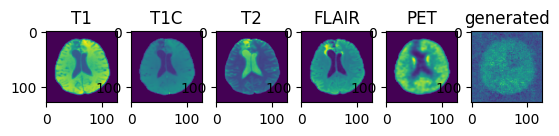

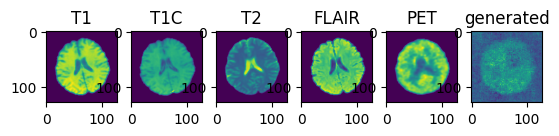

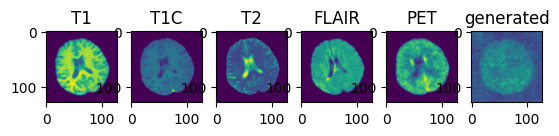

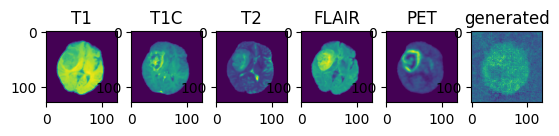

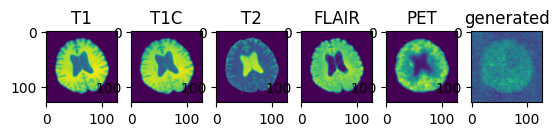

validation avg MS-SSIM: 0.3317 , train avg MS-SSIM: 0.3322
----------
epoch 141/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:01, 87.45s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:17, 37.71s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.81s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:54, 14.34s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.35s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.80s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.06s/it]

----------
epoch 142/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:33, 84.83s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.63s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.21s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.98s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.99s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.57s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.03s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 143/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.79s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.03s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.44s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.24s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.14s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.67s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.59s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.93s/it]

----------
epoch 144/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:38, 85.35s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.85s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.35s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.07s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.04s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.61s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.17s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.46s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 145/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:28, 84.42s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:04, 36.48s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.32s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.06s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.03s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.61s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.72s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 146/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:22<15:07, 82.49s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:04, 36.49s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:10, 21.14s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.94s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.95s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.56s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 147/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.80s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.07s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.66s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:54, 14.26s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.16s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.74s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.12s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 148/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:55, 86.89s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.48s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.70s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.26s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.82s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.00s/it]

----------
epoch 149/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:37, 85.27s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.05s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.47s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.15s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.64s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.09s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.03s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.91s/it]

----------
epoch 150/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.04s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.13s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.51s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.16s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.10s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.17s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

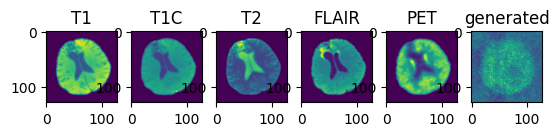

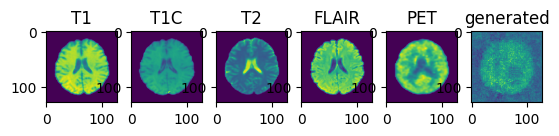

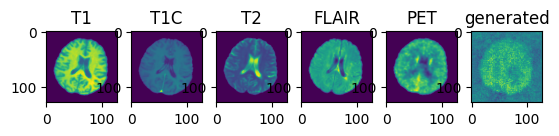

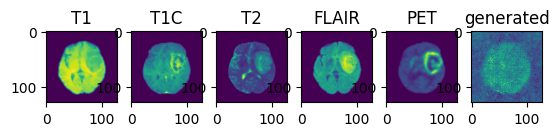

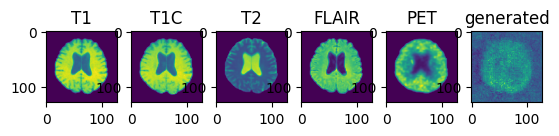

validation avg MS-SSIM: 0.3221 , train avg MS-SSIM: 0.3281
----------
epoch 151/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:58, 87.14s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:16, 37.62s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.76s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.31s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.19s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.25s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.18s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.07s/it]

----------
epoch 152/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:42, 85.72s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.02s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:14, 21.60s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.22s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.13s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.67s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.73s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 153/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:34, 84.92s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.69s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.27s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.02s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.01s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.60s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 154/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:48, 86.21s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.19s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.53s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.17s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.64s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 155/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.80s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.06s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.48s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.15s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.11s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.79s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.93s/it]

----------
epoch 156/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:03, 87.59s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:20, 38.07s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:18, 22.03s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.48s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.30s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.80s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:31,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.08s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.72s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.15s/it]

----------
epoch 157/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.03s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.15s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.51s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.16s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.10s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.78s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 158/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:09, 88.18s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:20, 38.01s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.97s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.43s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.27s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.75s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.17s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.13s/it]

----------
epoch 159/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:33, 84.90s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.68s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.26s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.01s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.12s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:46,  7.67s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.85s/it]

----------
epoch 160/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:12, 88.39s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:20, 38.08s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:18, 22.02s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:55, 14.48s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.31s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.80s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:52<00:13,  4.57s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.06s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.15s/it]

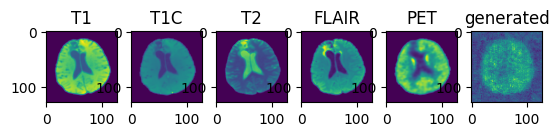

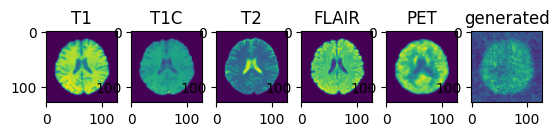

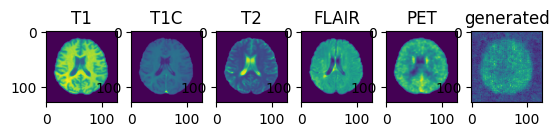

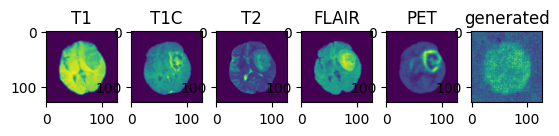

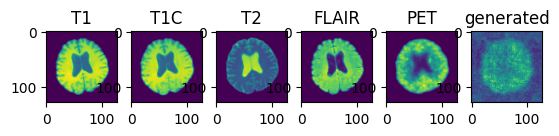

validation avg MS-SSIM: 0.3292 , train avg MS-SSIM: 0.3327
----------
epoch 161/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.74s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.61s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.21s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.98s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.97s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.56s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.04s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.36s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 162/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.80s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.45s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.69s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.27s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.17s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.81s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 163/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.77s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:23, 38.31s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:19, 22.14s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:56, 14.55s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.35s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.82s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:31,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.13s/it]

----------
epoch 164/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:50, 86.38s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.29s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.58s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.22s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:10, 10.13s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.79s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 165/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:49, 86.34s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.28s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.59s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.20s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.12s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.67s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 166/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:39, 85.38s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.89s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.37s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.08s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.17s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.91s/it]

----------
epoch 167/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:57, 87.00s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:15, 37.54s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.72s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.30s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.20s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.71s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.51s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.03s/it]

----------
epoch 168/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:57, 87.05s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:15, 37.59s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.76s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.32s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.35s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.82s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.07s/it]

----------
epoch 169/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:03, 87.55s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:17, 37.77s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.85s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.38s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.23s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.53s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.10s/it]

----------
epoch 170/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.75s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.00s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.43s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.11s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.19s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.91s/it]

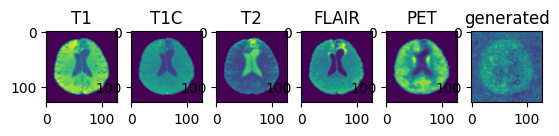

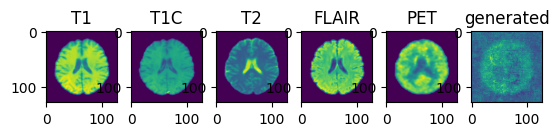

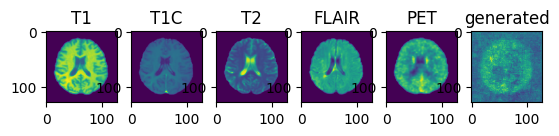

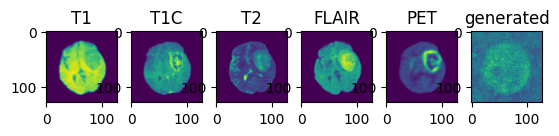

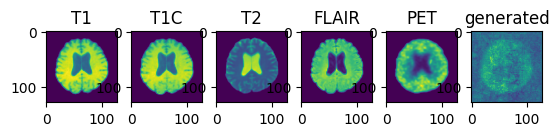

validation avg MS-SSIM: 0.3247 , train avg MS-SSIM: 0.3296
----------
epoch 171/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:37, 85.25s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.84s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.34s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.06s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.04s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.75s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.17s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 172/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.78s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:16, 37.65s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:16, 21.79s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.33s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.20s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.71s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.06s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.71s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.07s/it]

----------
epoch 173/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:53, 86.70s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.40s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.65s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:12, 10.29s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.78s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 174/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.78s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.64s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.23s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.00s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09, 10.00s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.58s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.05s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 175/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:24, 84.02s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:03, 36.30s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.10s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.93s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.08s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.63s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 176/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:53, 86.68s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.41s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.65s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.24s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.16s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.53s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.02s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.03s/it]

----------
epoch 177/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:47, 86.16s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.20s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.54s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.18s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.27s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.78s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 178/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:17, 88.89s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:23, 38.31s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:19, 22.14s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:56, 14.55s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.35s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:46,  7.80s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:46<00:30,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:52<00:13,  4.54s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:58<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.19s/it]

----------
epoch 179/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:40, 85.49s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.90s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.38s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.24s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

----------
epoch 180/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:44, 85.90s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.11s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.49s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.14s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.65s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.21s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

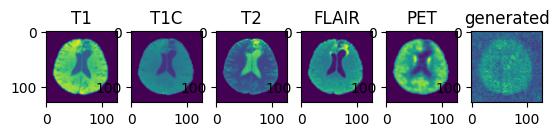

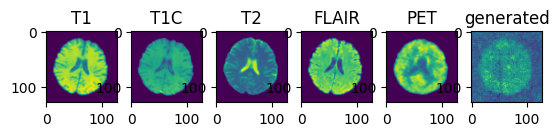

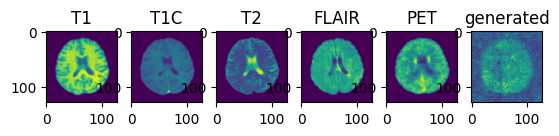

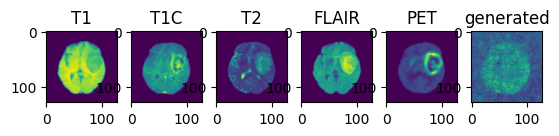

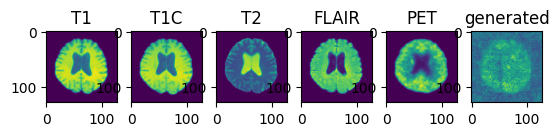

validation avg MS-SSIM: 0.3212 , train avg MS-SSIM: 0.3246
----------
epoch 181/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:52, 86.57s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.38s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.64s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.24s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.52s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.02s/it]

----------
epoch 182/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:52, 86.58s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.35s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.63s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.23s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.26s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.75s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.16s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 183/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:50, 86.40s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.28s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.59s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.23s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.14s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.20s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.48s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.00s/it]

----------
epoch 184/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:50, 86.40s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.31s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.60s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:56, 14.55s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:12, 10.35s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:47,  7.84s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.23s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.17s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.46s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.17s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.07s/it]

----------
epoch 185/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:20, 83.65s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:01, 36.16s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.02s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.89s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.94s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.54s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.03s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.17s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.48s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.77s/it]

----------
epoch 186/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:16, 88.75s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:22, 38.24s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:19, 22.12s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:57, 14.70s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:13, 10.45s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:47,  7.89s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:46<00:31,  6.26s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:20,  5.20s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:52<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:08,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:58<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.17s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.24s/it]

----------
epoch 187/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:35, 85.02s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:07, 36.74s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.32s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.04s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.61s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.07s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.18s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.46s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 188/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:38, 85.33s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.85s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.38s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.13s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.92s/it]

----------
epoch 189/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:41, 85.59s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.94s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.42s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.11s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.07s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.63s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.18s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.48s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.91s/it]

----------
epoch 190/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:58, 87.09s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:15, 37.57s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.73s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.45s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.29s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.17s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.07s/it]

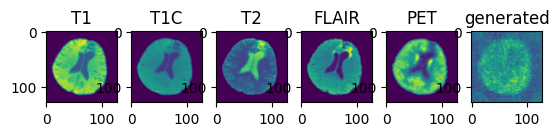

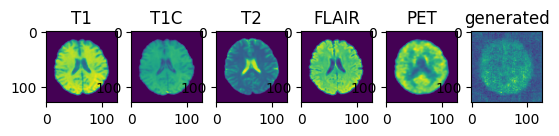

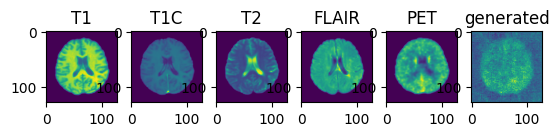

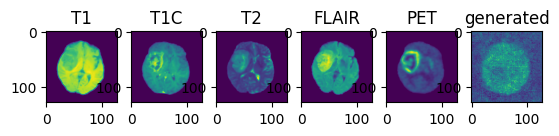

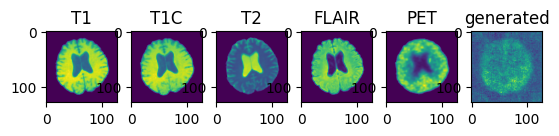

validation avg MS-SSIM: 0.3230 , train avg MS-SSIM: 0.3256
----------
epoch 191/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:16, 88.81s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:22, 38.27s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:18, 22.11s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:56, 14.53s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:13, 10.48s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:47,  7.89s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:46<00:31,  6.25s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:20,  5.18s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:52<00:13,  4.46s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:58<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.18s/it]

----------
epoch 192/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.78s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.44s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.68s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.26s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.16s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.50s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 193/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:27, 84.31s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:04, 36.43s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.12s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.07s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.05s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.62s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.07s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.83s/it]

----------
epoch 194/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:54, 86.77s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:15, 37.50s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.73s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.35s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.22s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.22s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.06s/it]

----------
epoch 195/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:36, 85.09s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:07, 36.75s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.30s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.19s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.12s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.66s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.10s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.93s/it]

----------
epoch 196/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:40, 85.48s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.92s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.39s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.09s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.06s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.63s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.92s/it]

----------
epoch 197/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:30, 84.58s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:05, 36.54s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:12, 21.34s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.05s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.01s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.58s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.04s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.35s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.89s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.83s/it]

----------
epoch 198/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:44, 85.85s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.04s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.44s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.11s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.05s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.61s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.17s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.91s/it]

----------
epoch 199/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:33, 84.87s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.65s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.40s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:54, 14.26s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.16s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.71s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 200/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.01s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.12s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.49s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.16s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.65s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

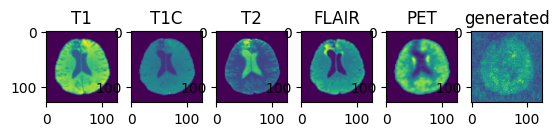

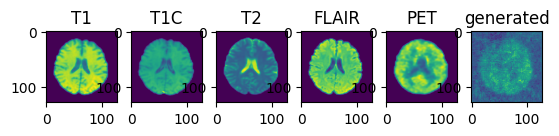

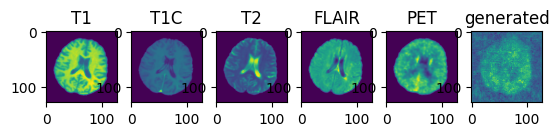

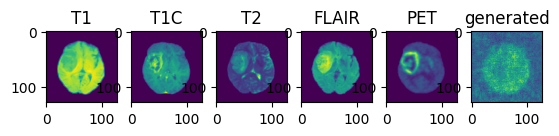

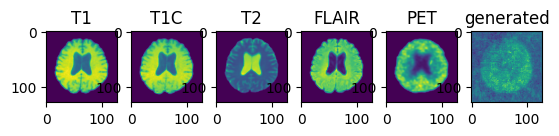

validation avg MS-SSIM: 0.3295 , train avg MS-SSIM: 0.3305
----------
epoch 201/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:53, 86.71s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.41s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.64s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.24s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.27s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.76s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.17s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.00s/it]

----------
epoch 202/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:55, 86.90s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.48s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.69s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.27s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.17s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.51s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.02s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 203/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:30<16:38, 90.77s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:33<06:30, 39.08s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:36<03:23, 22.56s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:39<01:58, 14.80s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:42<01:14, 10.64s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:45<00:48,  8.01s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:48<00:31,  6.35s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:51<00:21,  5.27s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:54<00:13,  4.53s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:57<00:08,  4.03s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [02:00<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.38s/it]

----------
epoch 204/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:00, 87.28s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:16, 37.66s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.78s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.32s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.19s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.71s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.61s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.09s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.73s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.07s/it]

----------
epoch 205/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:00, 87.33s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:16, 37.66s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.80s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.49s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.31s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.80s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.18s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.50s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.09s/it]

----------
epoch 206/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:26, 84.21s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:03, 36.39s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:09, 21.09s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.92s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.94s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.55s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.03s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 207/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:45, 85.96s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.10s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.49s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.29s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.18s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.71s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.15s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 208/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:32<16:54, 92.26s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:35<06:37, 39.70s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:38<03:26, 22.91s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:41<02:00, 15.02s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:43<01:14, 10.65s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:46<00:48,  8.01s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:49<00:31,  6.33s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:52<00:21,  5.34s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:55<00:13,  4.58s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:58<00:08,  4.06s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [02:01<00:03,  3.71s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:03<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.47s/it]

----------
epoch 209/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:33, 84.88s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.68s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.25s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:53, 14.14s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.63s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.59s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 210/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:18, 83.53s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:01, 36.13s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:08, 20.96s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.83s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.89s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.52s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.01s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.77s/it]

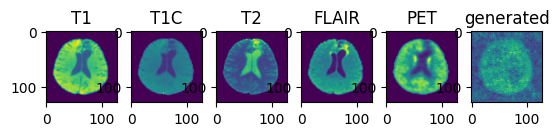

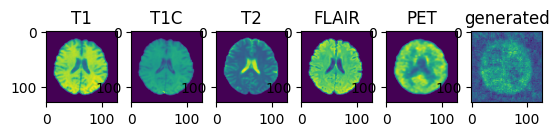

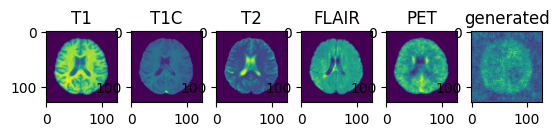

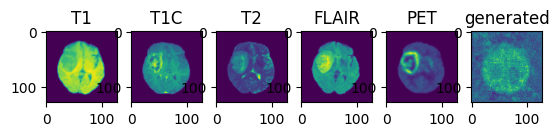

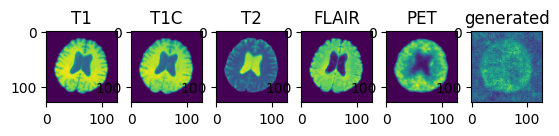

validation avg MS-SSIM: 0.3224 , train avg MS-SSIM: 0.3297
----------
epoch 211/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:12, 88.37s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:21, 38.10s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:18, 22.05s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:55, 14.49s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.32s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.80s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:21,  5.27s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:52<00:13,  4.53s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.03s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.18s/it]

----------
epoch 212/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:14, 88.58s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:21, 38.16s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:18, 22.06s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:57, 14.65s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.40s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:47,  7.84s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:46<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.13s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.19s/it]

----------
epoch 213/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.02s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.11s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.48s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.14s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.08s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.63s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.07s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 214/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:48, 86.20s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.20s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.53s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.33s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.21s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.12s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 215/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:49, 86.32s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.24s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.60s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.23s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.14s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.22s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.50s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 216/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:49, 86.30s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.25s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.73s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.29s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.17s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.70s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00, 10.00s/it]

----------
epoch 217/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.08s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.20s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.54s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.18s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.11s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.65s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 218/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:42, 85.71s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.01s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.67s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:54, 14.26s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.16s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 219/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:51, 86.52s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.31s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.59s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.21s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:10, 10.11s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.65s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00, 10.00s/it]

----------
epoch 220/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:42, 85.64s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.96s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:14, 21.57s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.21s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.14s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.73s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

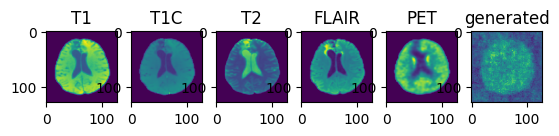

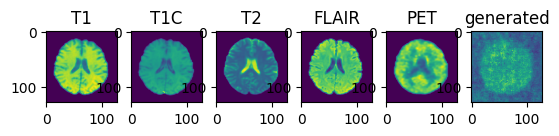

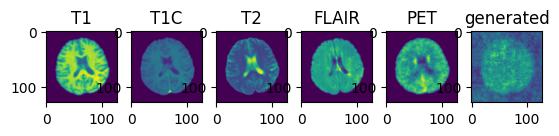

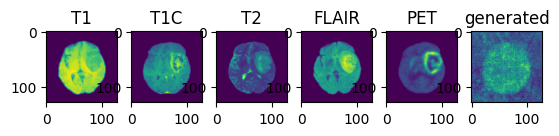

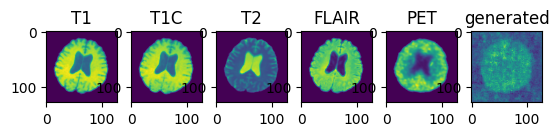

validation avg MS-SSIM: 0.3211 , train avg MS-SSIM: 0.3286
----------
epoch 221/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.76s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.05s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.46s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.12s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.22s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 222/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:12, 88.37s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:20, 38.09s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:18, 22.03s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:55, 14.49s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.31s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.79s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.56s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.15s/it]

----------
epoch 223/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:51, 86.51s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.32s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.60s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.22s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.28s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.78s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.00s/it]

----------
epoch 224/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:47, 86.14s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.19s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.54s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.20s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.14s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.56s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.06s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 225/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:49, 86.28s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.23s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:13, 21.55s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.19s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.27s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 226/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:51, 86.52s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.34s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.64s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.23s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:10, 10.14s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.67s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 227/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:52, 86.59s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.37s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.64s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.28s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.78s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 228/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:50, 86.44s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.31s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.60s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.22s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:10, 10.14s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.67s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 229/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:44, 85.84s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.06s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.46s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.14s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.22s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.74s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.16s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 230/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.81s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.61s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.21s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.98s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.98s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.56s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.02s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

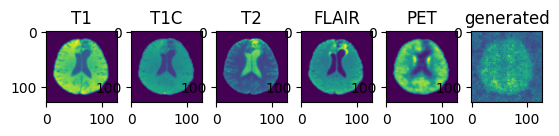

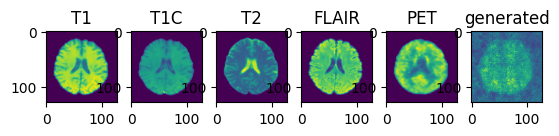

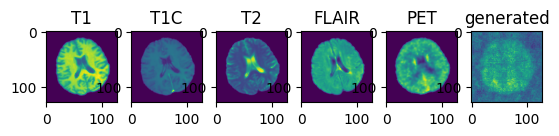

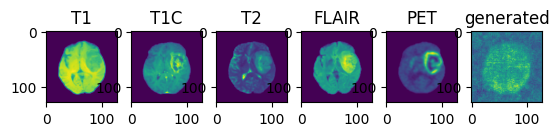

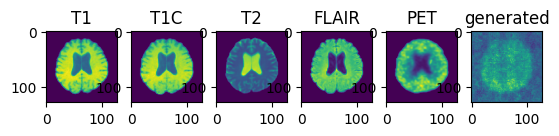

validation avg MS-SSIM: 0.3234 , train avg MS-SSIM: 0.3296
----------
epoch 231/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:48, 86.19s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.18s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.69s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.26s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.16s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.99s/it]

----------
epoch 232/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:22, 83.91s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:02, 36.27s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.02s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.85s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.90s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.52s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

----------
epoch 233/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:53, 86.67s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.39s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:16, 21.83s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.35s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.21s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.72s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.02s/it]

----------
epoch 234/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:30, 84.62s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:05, 36.53s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.16s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.94s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.95s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.54s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.81s/it]

----------
epoch 235/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.76s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.63s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:18, 22.01s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:55, 14.49s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:12, 10.31s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.80s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.46s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.76s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.13s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

----------
epoch 236/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:55, 86.88s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:14, 37.48s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.73s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.30s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.20s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.29s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.21s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.49s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.04s/it]

----------
epoch 237/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:41, 85.60s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.95s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:14, 21.59s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.23s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.09s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.71s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 238/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:31<16:46, 91.50s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:34<06:33, 39.39s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:37<03:24, 22.72s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:40<01:59, 14.90s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:43<01:13, 10.57s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:46<00:47,  7.97s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:49<00:32,  6.45s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:52<00:21,  5.33s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:55<00:13,  4.58s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:58<00:08,  4.06s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [02:00<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.42s/it]

----------
epoch 239/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:44, 85.91s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.30s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.59s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.22s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.14s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.69s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.09s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.72s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00, 10.00s/it]

----------
epoch 240/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:36, 85.16s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:07, 36.78s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.31s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.03s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.72s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.90s/it]

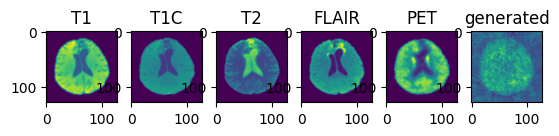

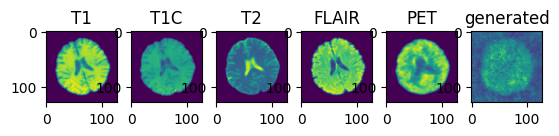

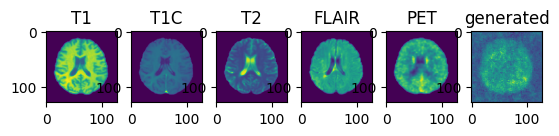

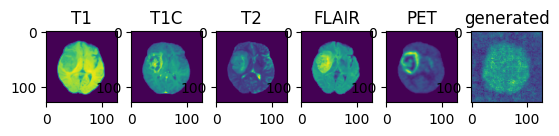

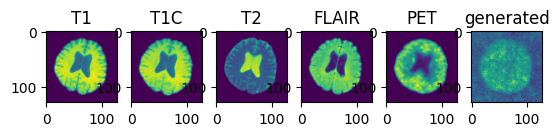

validation avg MS-SSIM: 0.3195 , train avg MS-SSIM: 0.3267
----------
epoch 241/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:35, 85.06s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:07, 36.74s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.29s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.03s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.74s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.16s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 242/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.78s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.83s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:12, 21.34s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.05s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.02s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.59s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.36s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  4.00s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 243/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:13, 83.07s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:25<05:59, 35.91s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:28<03:07, 20.84s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:31<01:50, 13.76s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:34<01:08,  9.85s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:37<00:45,  7.61s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:40<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:43<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:46<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:49<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.59s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.01s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.72s/it]

----------
epoch 244/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:48, 86.18s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.17s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.51s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.15s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.08s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.62s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.36s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 245/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:47, 86.11s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.17s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.52s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.16s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.11s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.95s/it]

----------
epoch 246/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:27, 84.36s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:04, 36.45s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.14s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.93s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.95s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.55s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.03s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.47s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.83s/it]

----------
epoch 247/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:38, 85.28s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.81s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:11, 21.31s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.04s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.11s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.08s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.39s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.92s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.01s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.88s/it]

----------
epoch 248/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:50, 86.39s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.26s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:13, 21.55s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.18s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.10s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.64s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.96s/it]

----------
epoch 249/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:28, 84.38s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:04, 36.47s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.15s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.95s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.96s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.56s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.03s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.35s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.89s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.58s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.00s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 250/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:22<15:07, 82.50s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:25<05:56, 35.68s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:28<03:06, 20.71s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:31<01:49, 13.67s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:34<01:08,  9.78s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:36<00:44,  7.43s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:39<00:29,  5.94s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:42<00:19,  4.97s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:45<00:12,  4.31s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:48<00:07,  3.87s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:51<00:03,  3.56s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:52<00:00,  2.99s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  9.63s/it]

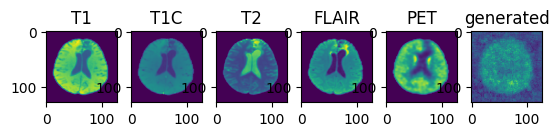

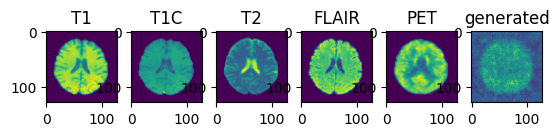

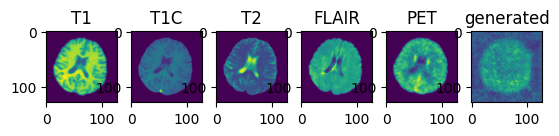

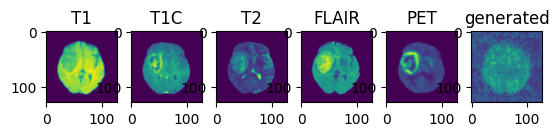

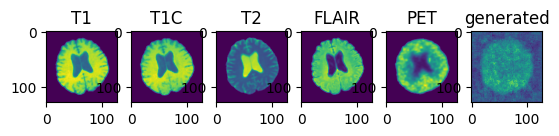

validation avg MS-SSIM: 0.3180 , train avg MS-SSIM: 0.3239
----------
epoch 251/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:01, 87.43s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:17, 37.71s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.81s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:54, 14.35s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.23s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.51s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.01s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.08s/it]

----------
epoch 252/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:47, 86.15s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:11, 37.18s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.53s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.19s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.28s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 253/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:06, 87.88s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:18, 37.89s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.92s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.41s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.27s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.76s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.55s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.10s/it]

----------
epoch 254/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.75s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.61s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.22s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 14.00s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.13s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:46,  7.68s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.12s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.11s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.42s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.04s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.87s/it]

----------
epoch 255/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:15, 88.64s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:31<06:24, 38.44s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:34<03:20, 22.23s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:37<01:56, 14.61s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:40<01:12, 10.38s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:43<00:47,  7.83s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:46<00:31,  6.22s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:49<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:52<00:13,  4.46s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:55<00:08,  4.07s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:58<00:03,  3.71s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00,  3.10s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00, 10.20s/it]

----------
epoch 256/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:43, 85.81s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.04s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.46s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.15s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.79s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.97s/it]

----------
epoch 257/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:50, 86.45s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:15, 37.54s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:15, 21.73s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.32s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.21s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.15s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.12s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:08,  4.08s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.73s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.03s/it]

----------
epoch 258/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:42, 85.70s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:09, 36.98s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.40s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.09s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.04s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:46,  7.73s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.40s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.92s/it]

----------
epoch 259/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:25, 84.13s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:05, 36.59s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:10, 21.21s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:51, 13.98s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09,  9.98s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.59s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.37s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.84s/it]

----------
epoch 260/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:51, 86.54s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:13, 37.33s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.62s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.24s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.15s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.82s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.01s/it]

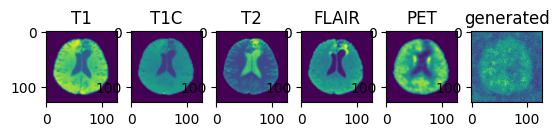

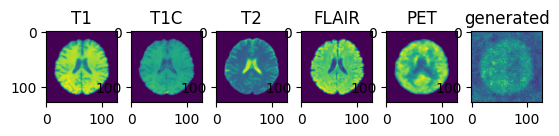

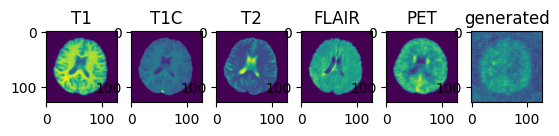

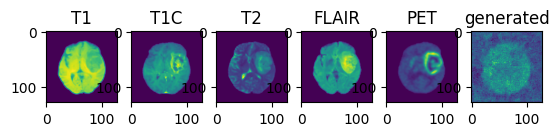

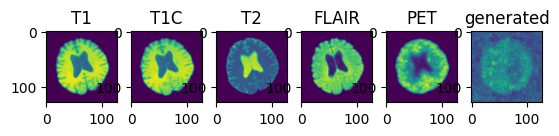

validation avg MS-SSIM: 0.3171 , train avg MS-SSIM: 0.3250
----------
epoch 261/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:28<16:08, 88.03s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:19, 37.99s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.96s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.44s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.27s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.77s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.18s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:51<00:13,  4.56s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:54<00:08,  4.04s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:57<00:03,  3.70s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  3.09s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.13s/it]

----------
epoch 262/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<16:01, 87.38s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:16, 37.69s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:16, 21.81s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:54, 14.34s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:12, 10.36s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.82s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:31,  6.21s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:48<00:20,  5.15s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.98s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.64s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:00<00:00, 10.08s/it]

----------
epoch 263/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:30<16:37, 90.66s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:33<06:30, 39.02s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:36<03:22, 22.53s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:39<01:58, 14.79s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:42<01:13, 10.50s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:45<00:47,  7.92s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:48<00:31,  6.28s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:50<00:20,  5.20s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:54<00:13,  4.59s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:57<00:08,  4.08s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [02:00<00:03,  3.72s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:04<00:00, 10.36s/it]

----------
epoch 264/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:48, 86.27s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.24s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.58s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:54, 14.25s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:12, 10.29s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.78s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.19s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.95s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

----------
epoch 265/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:32, 84.81s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:06, 36.66s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:11, 21.24s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.00s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:09, 10.00s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.59s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.05s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.37s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.59s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.01s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.83s/it]

----------
epoch 266/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:21, 83.75s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:01, 36.17s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:08, 20.96s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.82s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:10, 10.01s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.59s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.04s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.35s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:49<00:07,  3.89s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.58s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  2.99s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.75s/it]

----------
epoch 267/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:45, 85.95s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:10, 37.07s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.46s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:52, 14.12s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.06s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.61s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.37s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.90s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.58s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.00s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.89s/it]

----------
epoch 268/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:20, 83.65s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:01, 36.15s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:08, 20.97s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.83s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:10, 10.01s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.59s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.05s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.37s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.60s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 269/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:46, 86.07s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:11, 37.16s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:13, 21.51s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.16s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.64s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.06s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.48s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.99s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.65s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.05s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.94s/it]

----------
epoch 270/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:26<15:50, 86.41s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:29<06:12, 37.27s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:32<03:14, 21.57s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:35<01:53, 14.20s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:38<01:11, 10.25s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:41<00:46,  7.75s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:44<00:30,  6.16s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.13s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.44s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:52<00:07,  3.96s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:55<00:03,  3.63s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  3.03s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.98s/it]

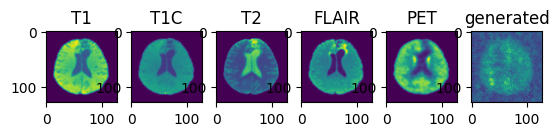

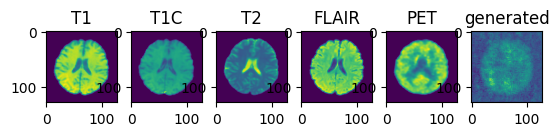

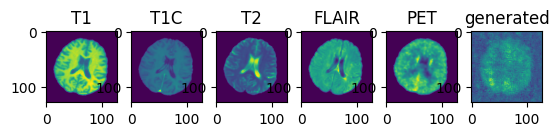

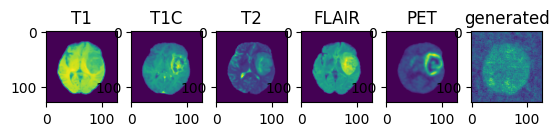

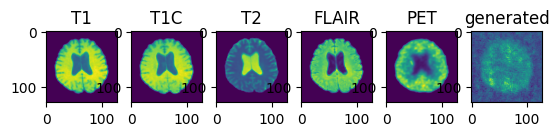

validation avg MS-SSIM: 0.3201 , train avg MS-SSIM: 0.3286
----------
epoch 271/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:22<15:10, 82.79s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:25<05:57, 35.79s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:28<03:06, 20.76s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:31<01:49, 13.70s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:34<01:08,  9.79s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:37<00:45,  7.58s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:40<00:30,  6.04s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:43<00:20,  5.03s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:46<00:13,  4.35s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:49<00:07,  3.90s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:51<00:03,  3.58s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:53<00:00,  3.01s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.69s/it]

----------
epoch 272/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:17, 83.42s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:02, 36.28s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.04s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.87s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.91s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.52s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:29,  6.00s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:43<00:20,  5.00s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:46<00:13,  4.34s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:49<00:07,  3.89s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.66s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

----------
epoch 273/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:24, 84.01s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:02, 36.30s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.05s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.88s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.92s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.52s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.14s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.93s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.78s/it]

----------
epoch 274/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:30, 84.62s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:27<06:05, 36.55s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:30<03:12, 21.35s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:33<01:52, 14.08s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:36<01:10, 10.04s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:39<00:45,  7.62s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:42<00:30,  6.08s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:45<00:20,  5.07s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:48<00:13,  4.38s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.91s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.68s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:55<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  9.86s/it]

----------
epoch 275/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:25<15:39, 85.36s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:28<06:08, 36.85s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:31<03:12, 21.34s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:34<01:53, 14.17s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:37<01:10, 10.09s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:40<00:45,  7.64s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:43<00:30,  6.20s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:46<00:20,  5.14s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:49<00:13,  4.43s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:51<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:54<00:03,  3.62s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:59<00:00,  9.92s/it]

----------
epoch 276/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:20, 83.69s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:01, 36.16s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:10, 21.15s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.93s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.95s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.54s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.01s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.01s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.34s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:49<00:07,  3.89s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.06s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.79s/it]

----------
epoch 277/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:31<16:43, 91.24s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:34<06:32, 39.28s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:37<03:24, 22.67s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:39<01:58, 14.87s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:42<01:13, 10.56s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:45<00:47,  7.98s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:49<00:32,  6.47s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:52<00:21,  5.33s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:55<00:13,  4.57s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:57<00:08,  4.05s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [02:00<00:03,  3.69s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:02<00:00,  3.08s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:05<00:00, 10.42s/it]

----------
epoch 278/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:16, 83.31s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:00, 36.01s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.07s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:51, 13.90s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.94s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.53s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.01s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:43<00:20,  5.02s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:46<00:13,  4.35s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:49<00:07,  3.89s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.67s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.07s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:56<00:00,  9.75s/it]

----------
epoch 279/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:23<15:13, 83.05s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:02, 36.30s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.04s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.87s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:09,  9.92s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.53s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.13s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.10s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.41s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.94s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:52<00:03,  3.61s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.02s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:57<00:00,  9.76s/it]

----------
epoch 280/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:27<15:58, 87.12s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:30<06:15, 37.60s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:33<03:17, 21.98s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:36<01:55, 14.44s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:39<01:11, 10.28s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:42<00:46,  7.76s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:45<00:30,  6.17s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:47<00:20,  5.16s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:50<00:13,  4.45s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:53<00:07,  3.97s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:56<00:03,  3.73s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:58<00:00,  3.11s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [02:01<00:00, 10.11s/it]

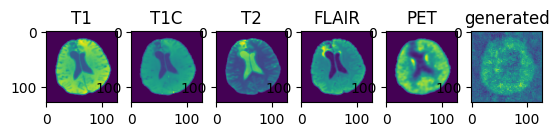

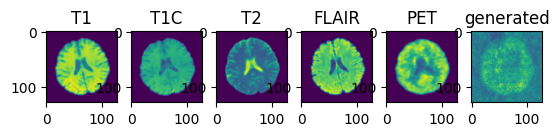

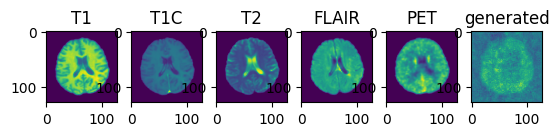

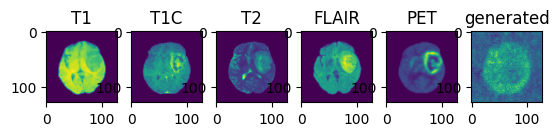

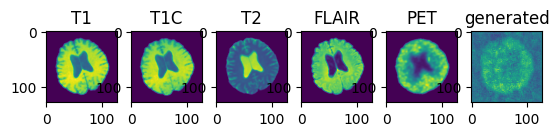

validation avg MS-SSIM: 0.3179 , train avg MS-SSIM: 0.3226
----------
epoch 281/350


Epoch :   0%|                                                                                                                                             | 0/12 [00:00<?, ?it/s]

Epoch :   8%|███████████                                                                                                                          | 1/12 [01:24<15:24, 84.02s/it]

Epoch :  17%|██████████████████████▏                                                                                                              | 2/12 [01:26<06:02, 36.29s/it]

Epoch :  25%|█████████████████████████████████▎                                                                                                   | 3/12 [01:29<03:09, 21.03s/it]

Epoch :  33%|████████████████████████████████████████████▎                                                                                        | 4/12 [01:32<01:50, 13.86s/it]

Epoch :  42%|███████████████████████████████████████████████████████▍                                                                             | 5/12 [01:35<01:10, 10.05s/it]

Epoch :  50%|██████████████████████████████████████████████████████████████████▌                                                                  | 6/12 [01:38<00:45,  7.61s/it]

Epoch :  58%|█████████████████████████████████████████████████████████████████████████████▌                                                       | 7/12 [01:41<00:30,  6.06s/it]

Epoch :  67%|████████████████████████████████████████████████████████████████████████████████████████▋                                            | 8/12 [01:44<00:20,  5.04s/it]

Epoch :  75%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                                 | 9/12 [01:47<00:13,  4.36s/it]

Epoch :  83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████                      | 10/12 [01:50<00:07,  3.90s/it]

Epoch :  92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████           | 11/12 [01:53<00:03,  3.58s/it]

Epoch : 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:54<00:00,  3.00s/it]

In [12]:
epoch_loss_values = [(0, 0)]
gen_step_loss = []
disc_step_loss = []
step = 0
max_epochs = 350
disc_train_interval = 1
disc_train_steps = 1
validation_interval = 10
best_ssim = 0
torch.cuda.empty_cache()

for epoch in range(max_epochs):
    
    gen_net.train()
    disc_net.train()
    epoch_loss = 0

    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")

    for batch_data in tqdm(train_loader, desc=("Epoch ")):
        input_images = torch.cat((batch_data["t1"].to(device, dtype=torch.float), 
                                 batch_data["t1c"].to(device, dtype=torch.float), 
                                 batch_data["t2"].to(device, dtype=torch.float), 
                                 batch_data["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        real_pet = batch_data["pet"].to(device, dtype=torch.float)
        
        gen_images = gen_net(input_images)
        gen_opt.zero_grad()
        loss = generator_loss(gen_images, real_pet)
        loss.backward()
        gen_opt.step()
        epoch_loss += loss.item()
        
        real_pet = real_pet[:,0,:,:,:]
        gen_images = gen_images[:,0,:,:,:]

        gen_step_loss.append((step, loss.item()))

        if step % disc_train_interval == 0:
            disc_total_loss = 0

            for _ in range(disc_train_steps):
                disc_opt.zero_grad()
                dloss = discriminator_loss(gen_images, real_pet)
                dloss.backward()
                disc_opt.step()
                disc_total_loss += dloss.item()

            disc_step_loss.append((step, disc_total_loss / disc_train_steps))
        step += 1
    
    epoch_loss /= step
    epoch_loss_values.append((step, epoch_loss))

    if (epoch+1) % validation_interval == 0:
        gen_net.eval()
        slice_index = 32
        ms_ssim = []
        ms_ssim_train = []
        ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)
        
        with torch.no_grad():

            for item in train_metric_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)
                
                generated = gen_net(input_images)
                ms_ssim_train.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))

            curr_ssim_train = torch.mean(torch.FloatTensor(ms_ssim_train))
            
            for item in valid_loader:
                input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

                generated = gen_net(input_images)
        
                image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
                f, axarr = plt.subplots(1, 6)

                ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
                axarr[0].imshow(image_datas[0])
                axarr[0].set_title("T1")
                axarr[1].imshow(image_datas[1])
                axarr[1].set_title("T1C")
                axarr[2].imshow(image_datas[2])
                axarr[2].set_title("T2")
                axarr[3].imshow(image_datas[3])
                axarr[3].set_title("FLAIR")
                axarr[4].imshow(image_datas[4])
                axarr[4].set_title("PET")
                axarr[5].imshow(image_datas[5].cpu())
                axarr[5].set_title("generated")
                plt.show()
                
            curr_ssim = torch.mean(torch.FloatTensor(ms_ssim))

            if curr_ssim > best_ssim:
                best_ssim = curr_ssim
                torch.save({
                        'epoch': epoch,
                        'model_state_dict': gen_net.state_dict(),
                        'optimizer_state_dict': gen_opt.state_dict(),
                        }, "best_metric_glagan.pth")
                
        print("validation avg MS-SSIM: {:.4f} , train avg MS-SSIM: {:.4f}".format(curr_ssim, curr_ssim_train))
            

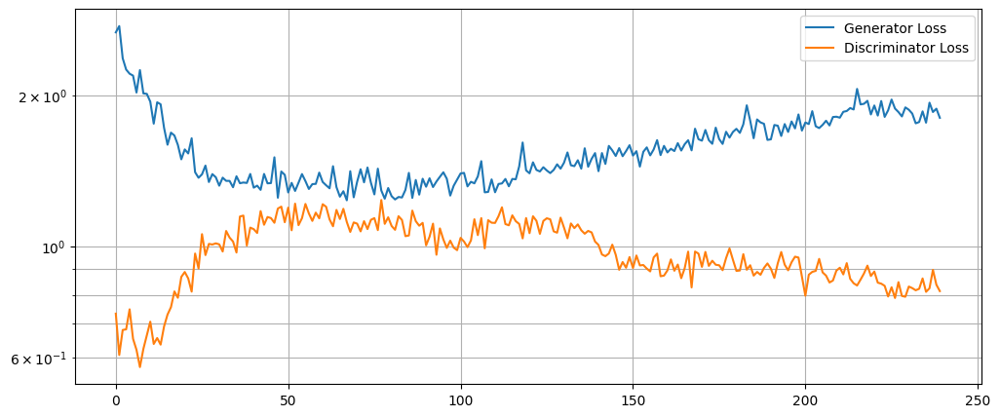

In [25]:
plt.figure(figsize=(12, 5))
plt.semilogy(*zip(*gen_step_loss), label="Generator Loss")
plt.semilogy(*zip(*disc_step_loss), label="Discriminator Loss")
plt.grid(True, "both", "both")
plt.legend()

In [ ]:

slice_index = 32

torch.cuda.empty_cache()

saved_dict = torch.load("best_metric_glagan.pth")
gen_net.load_state_dict(saved_dict['model_state_dict'])
gen_net.eval()

ms_ssim = []
ms_ssim_function = monai.metrics.MultiScaleSSIMMetric(spatial_dims = 3, reduction="none", kernel_size=4)

for item in check_DataLoader:

    with torch.no_grad():
        
        input_images = torch.cat((item["t1"].to(device, dtype=torch.float), 
                                     item["t1c"].to(device, dtype=torch.float), 
                                     item["t2"].to(device, dtype=torch.float), 
                                     item["flair"].to(device, dtype=torch.float)), dim=1).to(device)

        generated = gen_net(input_images)
        
        image_datas = item["t1"][0, 0, :, :, slice_index], item["t1c"][0, 0, :, :, slice_index], item["t2"][0, 0, :, :, slice_index], item["flair"][0, 0, :, :, slice_index], item["pet"][0, 0, :, :, slice_index], generated[0, 0, :, :, slice_index] 
                
        f, axarr = plt.subplots(1, 6)

        ms_ssim.append(ms_ssim_function(generated.to(device), item["pet"].to(device)))
                
        axarr[0].imshow(image_datas[0])
        axarr[0].set_title("T1")
        axarr[1].imshow(image_datas[1])
        axarr[1].set_title("T1C")
        axarr[2].imshow(image_datas[2])
        axarr[2].set_title("T2")
        axarr[3].imshow(image_datas[3])
        axarr[3].set_title("FLAIR")
        axarr[4].imshow(image_datas[4])
        axarr[4].set_title("PET")
        axarr[5].imshow(image_datas[5].cpu())
        axarr[5].set_title("generated")
        plt.show()


now = time()
print("It has been {0} seconds since the loop started".format(now - program_starts))

print("validation avg MS-SSIM: {:.4f} validation avg MSE {:.4f}".format(torch.mean(torch.FloatTensor(ms_ssim)), 0))